### Basic Setups

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import Parameter
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import v2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
from PIL import Image
from tqdm import tqdm
import matplotlib.patches as patches
import torch.optim as optim
from torchmetrics.detection import MeanAveragePrecision
from sklearn.Model_selection import KFold
import gc
import pandas as pd

c:\Users\justi\anaconda3\envs\pytorch\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
Device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using",Device)

Using cuda


In [3]:
Seed = 42

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(Seed)

### Data Preprocessing

In [4]:
DataRoot = "Dataset"
BatchSize = 32

Mean = (0.4914, 0.4822, 0.4465)
Std = (0.2023, 0.1994, 0.2010)

Classes = ('background', 'car', 'heavy_vehicle', 'motorcycle')

In [5]:
TrainTF = v2.Compose([
    v2.Resize((32, 32)),
    
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomPerspective(distortion_scale=0.2, p=0.5),
    v2.RandomAffine(degrees=15, scale=(0.7, 1.2), translate=(0.1, 0.1)),

    v2.RandomResizedCrop(size=(32, 32), scale=(0.7, 1.0)),

    v2.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 2.0)),
    v2.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue = 0.1),

    v2.ToImage(), 
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(Mean, Std)
])

ValTF = v2.Compose([
    v2.Resize((32, 32)),         
    v2.ToImage(),               
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(Mean, Std)
])

In [6]:
class YOLOProjectDataset(Dataset):
    def __init__(self, ImageFolder, LabelFolder, Transform):
        self.ImageFolder = ImageFolder
        self.LabelFolder = LabelFolder
        self.Transform = Transform
        self.ImageNames = [f for f in os.listdir(ImageFolder) if f.endswith(('.jpg', '.png'))]

    def __len__(self): return len(self.ImageNames)

    def __getitem__(self, idx):
        ImgPath = os.path.join(self.ImageFolder, self.ImageNames[idx])
        LabelPath = os.path.join(self.LabelFolder, self.ImageNames[idx].rsplit('.', 1)[0] + '.txt')
        
        img = Image.open(ImgPath).convert("RGB")
        
        TargetClasses = 0
        TargetBoxes = torch.zeros(4)
        
        if os.path.exists(LabelPath):
            with open(LabelPath, 'r') as f:
                line = f.readline().split()
                if line:
                    TargetClasses = int(line[0]) 
                    TargetBoxes = torch.tensor([float(x) for x in line[1:5]])

        if self.Transform: img = self.Transform(img)
            
        return img, TargetClasses, TargetBoxes

### CNN Architecture

In [7]:
class ShuffleAttention(nn.Module):
    def __init__(self, channel, groups=8):
        super(ShuffleAttention, self).__init__()
        self.groups = groups
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.cweight = Parameter(torch.zeros(1, channel // (2 * groups), 1, 1))
        self.cbias = Parameter(torch.ones(1, channel // (2 * groups), 1, 1))
        self.sweight = Parameter(torch.zeros(1, channel // (2 * groups), 1, 1))
        self.sbias = Parameter(torch.ones(1, channel // (2 * groups), 1, 1))

        self.sigmoid = nn.Sigmoid()
        self.gn = nn.GroupNorm(channel // (2 * groups), channel // (2 * groups))

    @staticmethod
    def channel_shuffle(x, groups):
        b, c, h, w = x.shape

        x = x.reshape(b, groups, -1, h, w)
        x = x.permute(0, 2, 1, 3, 4)

        x = x.reshape(b, -1, h, w)

        return x

    def forward(self, x):
        b, c, h, w = x.shape

        x = x.reshape(b * self.groups, -1, h, w)
        x_0, x_1 = x.chunk(2, dim=1)

        xn = self.avg_pool(x_0)
        xn = self.cweight * xn + self.cbias
        xn = x_0 * self.sigmoid(xn)

        xs = self.gn(x_1)
        xs = self.sweight * xs + self.sbias
        xs = x_1 * self.sigmoid(xs)

        out = torch.cat([xn, xs], dim=1)
        out = out.reshape(b, -1, h, w)

        out = self.channel_shuffle(out, 2)
        return out

In [8]:
class ConvolutionalNeuralNetwork(nn.Module):
    def __init__(self, num_classes=4):
        super().__init__()

        self.ConvolutionBlocks = nn.Sequential(
            
            # ================================== Block I ==================================
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, padding=1), # Second Conv
            nn.BatchNorm2d(32),
            nn.ReLU(),
            ShuffleAttention(32),
            nn.MaxPool2d(2, 2),
            nn.Dropout(0.25),
            
            # ================================== Block II ==================================
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1), # Second Conv
            nn.BatchNorm2d(64),
            nn.ReLU(),
            ShuffleAttention(64),
            nn.MaxPool2d(2, 2),
            nn.Dropout(0.25),
            
            # ================================== Block III ==================================
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, padding=1), # Second Conv
            nn.BatchNorm2d(128),
            nn.ReLU(),
            ShuffleAttention(128),
            nn.MaxPool2d(2, 2),
            nn.Dropout(0.25),

            # ================================== Block IV ==================================
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            ShuffleAttention(256),
            nn.MaxPool2d(2, 2),
            nn.Dropout(0.25),
            
            # ================================== Block V ==================================
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            ShuffleAttention(512),
            nn.MaxPool2d(2, 2),
            nn.Dropout(0.25)
        )

        self.flatten = nn.Flatten()

        self.classifier = nn.Sequential(
            nn.Linear(512 * 1 * 1, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

        self.bbox = nn.Sequential(
            nn.Linear(512 * 1 * 1, 256),
            nn.ReLU(),
            nn.Linear(256, 4),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        x = self.ConvolutionBlocks(x)
        x = self.flatten(x)

        ClassLogits = self.classifier(x)
        BoundingBoxCoordinates = self.bbox(x)
            
        return ClassLogits, BoundingBoxCoordinates

CNN = ConvolutionalNeuralNetwork().to(Device)

### Optimizer and Criterion

In [9]:
ClassWeights = torch.tensor([0.1, 1.0, 1.5, 5.0], dtype=torch.float).to(Device)

ClassificationLoss = nn.CrossEntropyLoss(weight = ClassWeights)

CoordinatesLoss = nn.SmoothL1Loss() 

def IntersectionOverUnion(box1, box2):
    b1_x1, b1_y1 = box1[:, 0] - box1[:, 2]/2, box1[:, 1] - box1[:, 3]/2
    b1_x2, b1_y2 = box1[:, 0] + box1[:, 2]/2, box1[:, 1] + box1[:, 3]/2
    b2_x1, b2_y1 = box2[:, 0] - box2[:, 2]/2, box2[:, 1] - box2[:, 3]/2
    b2_x2, b2_y2 = box2[:, 0] + box2[:, 2]/2, box2[:, 1] + box2[:, 3]/2

    intersection_x1 = torch.max(b1_x1, b2_x1)
    intersection_y1 = torch.max(b1_y1, b2_y1)
    intersection_x2 = torch.min(b1_x2, b2_x2)
    intersection_y2 = torch.min(b1_y2, b2_y2)
    
    intersection_area = (intersection_x2 - intersection_x1).clamp(0) * (intersection_y2 - intersection_y1).clamp(0)

    b1_area = (b1_x2 - b1_x1) * (b1_y2 - b1_y1)
    b2_area = (b2_x2 - b2_x1) * (b2_y2 - b2_y1)
    
    return torch.mean(intersection_area / (b1_area + b2_area - intersection_area + 1e-6))

### Training and Evaluation

In [ ]:
def TrainingAndEvaluation(FoldIndex, Model, TrainingSet, ValidationSet, Device, Optimizer, mAP_50, Epochs = 20):
    best_v_map = 0.0
    
    mAP_50 = mAP_50.to(Device)

    history = {
        'train_loss': [], 
        'val_loss': [],
        'train_cls_acc': [], 
        'val_cls_acc': [],
        'val_iou': [],
        'val_precision': [],
        'val_recall': [],
        'val_mAP': []
    }

    print(f"{'Epoch':>8} {'GPU_mem':>10} {'box_loss':>10} {'cls_loss':>10} {'total':>10} {'IoU':>10} {'mAP@50':>10}")

    for epoch in range(Epochs):
        Model.train()
        t_loss, t_cls_err, t_box_err = 0, 0, 0
        correct, total = 0, 0
        
        pbar = tqdm(TrainingSet, desc=f"Epoch {epoch+1}/{Epochs}", leave=False)
        for imgs, labels, boxes in pbar:
            imgs, labels, boxes = imgs.to(Device), labels.to(Device), boxes.to(Device)

            Optimizer.zero_grad()
            out_cls, out_box = Model(imgs)

            loss_cls = ClassificationLoss(out_cls, labels)
            loss_box = CoordinatesLoss(out_box, boxes)
            total_loss = loss_cls + (5.0 * loss_box)

            total_loss.backward()
            Optimizer.step()

            t_loss += total_loss.item()
            t_cls_err += loss_cls.item()
            t_box_err += loss_box.item()
            _, predicted = torch.max(out_cls.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            pbar.set_postfix(loss=f"{total_loss.item():.4f}")

        Model.eval()
        v_loss, v_iou = 0, 0
        v_correct, v_total = 0, 0
        mAP_50.reset()

        with torch.no_grad():
            val_pbar = tqdm(ValidationSet, desc=f"Validating Epoch {epoch+1}/{Epochs}", leave=False)

            for imgs, labels, boxes in val_pbar:
                imgs, labels, boxes = imgs.to(Device), labels.to(Device), boxes.to(Device)
                out_cls, out_box = Model(imgs)
                
                v_loss += (ClassificationLoss(out_cls, labels) + 5.0 * CoordinatesLoss(out_box, boxes)).item()
                probs = torch.softmax(out_cls, dim=1)
                scores, pred = torch.max(probs, dim=1)
                v_total += labels.size(0)
                v_correct += (pred == labels).sum().item()
                v_iou += IntersectionOverUnion(out_box, boxes)

                preds_list = [{'boxes': out_box[i].unsqueeze(0), 'scores': scores[i].unsqueeze(0), 'labels': pred[i].unsqueeze(0)} for i in range(imgs.shape[0])]
                target_list = [{'boxes': boxes[i].unsqueeze(0), 'labels': labels[i].unsqueeze(0)} for i in range(imgs.shape[0])]
                mAP_50.update(preds_list, target_list)

        mAP_results = mAP_50.compute()
        gpu_mem = f"{torch.cuda.memory_reserved() / 1E9:.2f}G"
        avg_t_loss = t_loss / len(TrainingSet)
        avg_v_loss = v_loss / len(ValidationSet)
        avg_iou = v_iou / len(ValidationSet)
        current_map = mAP_results['map_50'].item()
        
        print(f"{epoch+1:>8} {gpu_mem:>10} "
            f"{t_box_err/len(TrainingSet):>10.4f} "
            f"{t_cls_err/len(TrainingSet):>10.4f} "
            f"{avg_t_loss:>10.4f} "
            f"{avg_iou:>10.4f} "
            f"{mAP_results['map_50']:>10.4f}")
        
        if current_map > best_v_map:
            best_v_map = current_map
            torch.save(Model.state_dict(), f'Best_Baseline_Fold_{FoldIndex+1}.pth')

        history['train_loss'].append(avg_t_loss)
        history['val_loss'].append(avg_v_loss)
        history['train_cls_acc'].append(100 * correct / total)
        history['val_cls_acc'].append(100 * v_correct / v_total)
        history['val_iou'].append(avg_iou.item())
        history['val_mAP'].append(mAP_results['map_50'].item())
        history['val_precision'].append(mAP_results['mar_1'].item())
        history['val_recall'].append(mAP_results['mar_10'].item())

    return Model, history

### Stratified K - Fold Cross Validation

In [ ]:
TestFolder = "Location A"
AllFolders = [
    "Location B", 
    "Location C", 
    "Location D", 
    "Location E", 
    "Location F"
]
NumFolds = 5

TestingData = YOLOProjectDataset(
    os.path.join(DataRoot, TestFolder, "images"),
    os.path.join(DataRoot, TestFolder, "labels"),
    ValTF
)
TestingSet = DataLoader(TestingData, batch_size=BatchSize, shuffle=False)

LocationDatasets = {}
for folder in AllFolders:
    ds = YOLOProjectDataset(
        os.path.join(DataRoot, folder, "images"),
        os.path.join(DataRoot, folder, "labels"),
        TrainTF    
    )
    LocationDatasets[folder] = ds

FoldResult = []
kf = KFold(n_splits=NumFolds, shuffle=True, random_state=42)

for fold in range(NumFolds):
    print(f"\n=============================== STARTING FOLD {fold + 1} ===============================")

    TrainSubsets = []
    ValSubsets   = []

    for folder, FullSet in LocationDatasets.items():
        n = len(FullSet)
        indices = list(range(n))

        splits = list(kf.split(indices))
        train_idx, val_idx = splits[fold]

        train_subset = torch.utils.data.Subset(FullSet, train_idx.tolist())

        val_ds = YOLOProjectDataset(
            os.path.join(DataRoot, folder, "images"),
            os.path.join(DataRoot, folder, "labels"),
            ValTF
        )
        val_subset = torch.utils.data.Subset(val_ds, val_idx.tolist())

        TrainSubsets.append(train_subset)
        ValSubsets.append(val_subset)

        print(f"  {folder}: {len(train_idx)} train | {len(val_idx)} val")

    TrainingData   = torch.utils.data.ConcatDataset(TrainSubsets)
    ValidationData = torch.utils.data.ConcatDataset(ValSubsets)

    print(f"\n  Total → Train: {len(TrainingData)} | Val: {len(ValidationData)}")

    TrainingSet   = DataLoader(TrainingData,   batch_size=BatchSize, shuffle=True)
    ValidationSet = DataLoader(ValidationData, batch_size=BatchSize, shuffle=False)

    CNNFold       = ConvolutionalNeuralNetwork().to(Device)
    OptimizerFold = optim.Adam(CNNFold.parameters(), lr=1e-4)
    mAP50         = MeanAveragePrecision(box_format='cxcywh')

    TrainedModel, history = TrainingAndEvaluation(fold, CNNFold, TrainingSet, ValidationSet, Device, OptimizerFold, mAP50)

    FoldResult.append(history)
    torch.save(TrainedModel.state_dict(), f'Baseline_Fold_{fold+1}.pth')

    del CNNFold, OptimizerFold, mAP50, TrainingData, ValidationData
    gc.collect()
    torch.cuda.empty_cache()
    print(f"Fold {fold+1} cleanup complete.")

print("\nCROSS VALIDATION COMPLETE.")


=============================== STARTING FOLD 1 ===============================
  Location B: 772 train | 194 val
  Location C: 873 train | 219 val
  Location D: 670 train | 168 val
  Location E: 160 train | 40 val
  Location F: 312 train | 79 val

  Total → Train: 2787 | Val: 700
   Epoch    GPU_mem   box_loss   cls_loss      total        IoU     mAP@50


       1      0.20G     0.0163     0.9119     0.9933     0.0646     0.0000


       2      0.20G     0.0148     0.7765     0.8506     0.0615     0.0000


       3      0.20G     0.0146     0.7420     0.8150     0.0601     0.0001


       4      0.20G     0.0143     0.7359     0.8072     0.0581     0.0000


       5      0.20G     0.0146     0.7287     0.8014     0.0571     0.0001


       6      0.20G     0.0140     0.7114     0.7815     0.0575     0.0006


       7      0.20G     0.0141     0.6923     0.7627     0.0563     0.0000


       8      0.20G     0.0139     0.6711     0.7407     0.0625     0.0001


       9      0.20G     0.0138     0.6812     0.7504     0.0546     0.0001


      10      0.20G     0.0140     0.6730     0.7429     0.0551     0.0003


      11      0.20G     0.0138     0.6707     0.7399     0.0564     0.0003


      12      0.20G     0.0134     0.6800     0.7470     0.0587     0.0003


      13      0.20G     0.0135     0.6493     0.7167     0.0597     0.0039


      14      0.20G     0.0132     0.6841     0.7501     0.0615     0.0004


      15      0.20G     0.0131     0.6426     0.7079     0.0659     0.0044


      16      0.20G     0.0131     0.6718     0.7371     0.0639     0.0034


      17      0.20G     0.0129     0.6481     0.7127     0.0612     0.0020


      18      0.20G     0.0127     0.6348     0.6985     0.0752     0.0029


      19      0.20G     0.0125     0.6421     0.7045     0.0674     0.0023


      20      0.20G     0.0125     0.6358     0.6981     0.0850     0.0211
Fold 1 cleanup complete.

=============================== STARTING FOLD 2 ===============================
  Location B: 773 train | 193 val
  Location C: 873 train | 219 val
  Location D: 670 train | 168 val
  Location E: 160 train | 40 val
  Location F: 313 train | 78 val

  Total → Train: 2789 | Val: 698
   Epoch    GPU_mem   box_loss   cls_loss      total        IoU     mAP@50


       1      0.25G     0.0171     0.9169     1.0024     0.0556     0.0001


       2      0.25G     0.0146     0.7953     0.8681     0.0545     0.0000


       3      0.25G     0.0143     0.7381     0.8094     0.0577     0.0001


       4      0.25G     0.0142     0.7254     0.7964     0.0566     0.0000


       5      0.25G     0.0140     0.6975     0.7676     0.0644     0.0002


       6      0.25G     0.0138     0.7043     0.7735     0.0625     0.0001


       7      0.25G     0.0135     0.6963     0.7639     0.0534     0.0001


       8      0.25G     0.0132     0.6809     0.7470     0.0694     0.0035


       9      0.25G     0.0131     0.6707     0.7360     0.0696     0.0053


      10      0.25G     0.0130     0.6830     0.7478     0.0580     0.0021


      11      0.25G     0.0129     0.6699     0.7342     0.0590     0.0035


      12      0.25G     0.0127     0.6512     0.7146     0.0558     0.0045


      13      0.25G     0.0127     0.6649     0.7286     0.0693     0.0066


      14      0.25G     0.0124     0.6415     0.7036     0.0652     0.0096


      15      0.25G     0.0123     0.6512     0.7128     0.0749     0.0080


      16      0.25G     0.0123     0.6364     0.6982     0.0660     0.0056


      17      0.25G     0.0122     0.6302     0.6915     0.0664     0.0001


      18      0.25G     0.0122     0.6189     0.6797     0.0673     0.0075


      19      0.25G     0.0121     0.6655     0.7259     0.0642     0.0038


      20      0.25G     0.0123     0.6388     0.7005     0.0758     0.0173
Fold 2 cleanup complete.

=============================== STARTING FOLD 3 ===============================
  Location B: 773 train | 193 val
  Location C: 874 train | 218 val
  Location D: 670 train | 168 val
  Location E: 160 train | 40 val
  Location F: 313 train | 78 val

  Total → Train: 2790 | Val: 697
   Epoch    GPU_mem   box_loss   cls_loss      total        IoU     mAP@50


       1      0.25G     0.0162     0.9179     0.9990     0.0588     0.0001


       2      0.25G     0.0144     0.8067     0.8788     0.0567     0.0001


       3      0.25G     0.0144     0.7509     0.8227     0.0590     0.0001


       4      0.25G     0.0142     0.7318     0.8026     0.0546     0.0001


       5      0.25G     0.0140     0.7302     0.8004     0.0534     0.0001


       6      0.25G     0.0140     0.6945     0.7643     0.0581     0.0001


       7      0.25G     0.0137     0.6657     0.7342     0.0573     0.0001


       8      0.25G     0.0138     0.6788     0.7477     0.0534     0.0002


       9      0.25G     0.0136     0.6644     0.7324     0.0590     0.0002


      10      0.25G     0.0133     0.6663     0.7327     0.0544     0.0001


      11      0.25G     0.0133     0.6767     0.7431     0.0589     0.0008


      12      0.25G     0.0131     0.6612     0.7266     0.0541     0.0046


      13      0.25G     0.0129     0.6562     0.7206     0.0555     0.0017


      14      0.25G     0.0125     0.6534     0.7158     0.0624     0.0081


      15      0.25G     0.0125     0.6493     0.7119     0.0667     0.0088


      16      0.25G     0.0127     0.6444     0.7080     0.0843     0.0250


      17      0.25G     0.0125     0.6416     0.7042     0.0558     0.0047


      18      0.25G     0.0123     0.6385     0.7001     0.0693     0.0135


      19      0.25G     0.0122     0.6271     0.6883     0.0609     0.0006


      20      0.25G     0.0122     0.6254     0.6864     0.0685     0.0050
Fold 3 cleanup complete.

=============================== STARTING FOLD 4 ===============================
  Location B: 773 train | 193 val
  Location C: 874 train | 218 val
  Location D: 671 train | 167 val
  Location E: 160 train | 40 val
  Location F: 313 train | 78 val

  Total → Train: 2791 | Val: 696
   Epoch    GPU_mem   box_loss   cls_loss      total        IoU     mAP@50


       1      0.25G     0.0174     0.9085     0.9957     0.0555     0.0000


       2      0.25G     0.0143     0.7810     0.8526     0.0515     0.0000


       3      0.25G     0.0142     0.7541     0.8250     0.0549     0.0000


       4      0.25G     0.0141     0.7247     0.7954     0.0549     0.0001


       5      0.25G     0.0141     0.7061     0.7766     0.0507     0.0000


       6      0.25G     0.0138     0.7051     0.7744     0.0574     0.0001


       7      0.25G     0.0139     0.6782     0.7477     0.0653     0.0004


       8      0.25G     0.0137     0.6815     0.7499     0.0555     0.0003


       9      0.25G     0.0136     0.6775     0.7456     0.0501     0.0018


      10      0.25G     0.0135     0.6541     0.7214     0.0702     0.0002


      11      0.25G     0.0131     0.6768     0.7424     0.0619     0.0025


      12      0.25G     0.0130     0.6617     0.7268     0.0828     0.0133


      13      0.25G     0.0129     0.6300     0.6944     0.0876     0.0219


      14      0.25G     0.0124     0.6315     0.6937     0.0773     0.0135


      15      0.25G     0.0125     0.6418     0.7040     0.0898     0.0227


      16      0.25G     0.0125     0.6367     0.6992     0.0771     0.0189


      17      0.25G     0.0123     0.6249     0.6864     0.0707     0.0145


      18      0.25G     0.0122     0.6210     0.6819     0.0693     0.0115


      19      0.25G     0.0121     0.6363     0.6970     0.0742     0.0184


      20      0.25G     0.0119     0.6205     0.6801     0.0801     0.0159
Fold 4 cleanup complete.

=============================== STARTING FOLD 5 ===============================
  Location B: 773 train | 193 val
  Location C: 874 train | 218 val
  Location D: 671 train | 167 val
  Location E: 160 train | 40 val
  Location F: 313 train | 78 val

  Total → Train: 2791 | Val: 696
   Epoch    GPU_mem   box_loss   cls_loss      total        IoU     mAP@50


       1      0.25G     0.0161     0.9028     0.9833     0.0535     0.0000


       2      0.25G     0.0145     0.7900     0.8623     0.0492     0.0000


       3      0.25G     0.0144     0.7359     0.8076     0.0471     0.0000


       4      0.25G     0.0140     0.7334     0.8035     0.0520     0.0000


       5      0.25G     0.0141     0.7304     0.8007     0.0506     0.0000


       6      0.25G     0.0137     0.6939     0.7626     0.0547     0.0000


       7      0.25G     0.0135     0.6916     0.7591     0.0780     0.0022


       8      0.25G     0.0133     0.6803     0.7468     0.0904     0.0047


       9      0.25G     0.0133     0.6930     0.7594     0.0772     0.0017


      10      0.25G     0.0131     0.6712     0.7369     0.0796     0.0017


      11      0.25G     0.0129     0.6801     0.7448     0.0703     0.0007


      12      0.25G     0.0130     0.6672     0.7322     0.0789     0.0009


      13      0.25G     0.0127     0.6744     0.7382     0.0667     0.0179


      14      0.25G     0.0127     0.6532     0.7166     0.0927     0.0075


      15      0.25G     0.0128     0.6390     0.7028     0.0892     0.0051


      16      0.25G     0.0127     0.6605     0.7239     0.0838     0.0141


      17      0.25G     0.0128     0.6527     0.7166     0.0836     0.0014


      18      0.25G     0.0125     0.6564     0.7187     0.0802     0.0034


      19      0.25G     0.0123     0.6464     0.7078     0.0751     0.0148


      20      0.25G     0.0124     0.6262     0.6881     0.0864     0.0097
Fold 5 cleanup complete.

CROSS VALIDATION COMPLETE.


### Visualization Results

In [15]:
output_dir = "Baseline Evaluation Metrics"
os.makedirs(output_dir, exist_ok=True)

metrics = [
    'train_loss', 'val_loss', 
    'train_cls_acc', 'val_cls_acc', 
    'val_iou', 'val_mAP', 
    'val_precision', 'val_recall'
]

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

for i, metric in enumerate(metrics):
    plt.figure(figsize=(10, 6))
    
    for fold_idx, history in enumerate(FoldResult):
        epochs = range(1, len(history[metric]) + 1)
        plt.plot(epochs, history[metric], 
                 label=f'Fold {fold_idx+1}', 
                 color=colors[fold_idx], 
                 alpha=0.8, linewidth=2.0) 
    
    metric_title = metric.replace('_', ' ').title()
    plt.title(f'5-Fold Cross-Validation: {metric_title}', fontsize=14, fontweight='bold')
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel(metric_title, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend(loc='best', fontsize='medium')
    plt.tight_layout()
    
    save_path = os.path.join(output_dir, f"{i + 1}. {metric}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Successfully saved: {save_path}")
    
    plt.close()

print("\nAll individual metric plots have been safely written to disk!")

Successfully saved: Baseline Evaluation Metrics\1. train_loss.png
Successfully saved: Baseline Evaluation Metrics\2. val_loss.png
Successfully saved: Baseline Evaluation Metrics\3. train_cls_acc.png
Successfully saved: Baseline Evaluation Metrics\4. val_cls_acc.png
Successfully saved: Baseline Evaluation Metrics\5. val_iou.png
Successfully saved: Baseline Evaluation Metrics\6. val_mAP.png
Successfully saved: Baseline Evaluation Metrics\7. val_precision.png
Successfully saved: Baseline Evaluation Metrics\8. val_recall.png

All individual metric plots have been safely written to disk!


In [16]:
def Summarize(FoldResults):
    Summary = []

    for i, history in enumerate(FoldResults):
        Peak_mAP = max(history['val_mAP'])
        PeakIoU = max(history['val_iou'])
        LowestLoss = min(history['val_loss'])
        PeakAcc = max(history['val_cls_acc'])
        
        Summary.append({
            'Fold': i + 1,
            'Best mAP@50': Peak_mAP,
            'Best IoU': PeakIoU,
            'Min Val Loss': LowestLoss,
            'Max Acc (%)': PeakAcc
        })

    df = pd.DataFrame(Summary)

    Means = df.mean(numeric_only=True).drop('Fold')
    StandardDeviations = df.std(numeric_only=True).drop('Fold')

    print("\n" + "="*50)
    print("      CROSS-VALIDATION PEAK PERFORMANCE")
    print("="*50)
    print(df.to_string(index=False, formatters={
        'Best mAP@50': '{:,.4f}'.format,
        'Best IoU': '{:,.4f}'.format,
        'Min Val Loss': '{:,.4f}'.format,
        'Max Acc (%)': '{:,.2f}%'.format
    }))
    
    print("-" * 50)
    
    print("FINAL SUMMARY (Mean ± Std Dev):")
    for metric in Means.index:
        unit = "%" if "Acc" in metric else ""
        print(f"{metric:<15}: {Means[metric]:.4f} ± {StandardDeviations[metric]:.4f}{unit}")
    print("="*50)

Summarize(FoldResult)


      CROSS-VALIDATION PEAK PERFORMANCE
 Fold Best mAP@50 Best IoU Min Val Loss Max Acc (%)
    1      0.0211   0.0850       0.6822      46.86%
    2      0.0173   0.0758       0.7431      49.00%
    3      0.0250   0.0843       0.7159      46.63%
    4      0.0227   0.0898       0.6630      50.43%
    5      0.0179   0.0927       0.6699      48.85%
--------------------------------------------------
FINAL SUMMARY (Mean ± Std Dev):
Best mAP@50    : 0.0208 ± 0.0032
Best IoU       : 0.0855 ± 0.0065
Min Val Loss   : 0.6948 ± 0.0338
Max Acc (%)    : 48.3529 ± 1.5963%


### Testing

In [42]:
def Testing(ImagePath, Model, Transform, Device, Classes, SavePath):
    Model.eval()

    OriginalImage = Image.open(ImagePath).convert("RGB")
    w, h = OriginalImage.size
    
    InputTensor = Transform(OriginalImage, None)[0].unsqueeze(0).to(Device)

    with torch.no_grad():
        OutputClass, OutputBox = Model(InputTensor)
        
        Probabilities = F.softmax(OutputClass, dim=1)
        Confidence, pred_idx = torch.max(Probabilities, 1)

    box = OutputBox.squeeze().cpu().numpy() 
    ConfidenceScore = Confidence.item()
    ClassName = Classes[pred_idx.item()]

    real_cx, real_cy = box[0] * w, box[1] * h
    real_w, real_h = box[2] * w, box[3] * h
    
    x1 = max(0, real_cx - (real_w / 2))
    y1 = max(0, real_cy - (real_h / 2))
    
    rect_w = min(w - x1, real_w)
    rect_h = min(h - y1, real_h)

    plt.figure(figsize=(10, 6))
    plt.imshow(OriginalImage)
    ax = plt.gca()
    
    rect = patches.Rectangle((x1, y1), rect_w, rect_h, linewidth=3, 
                             edgecolor='#00FF00', facecolor='none')
    ax.add_patch(rect)
    
    label_text = f"{ClassName}: {ConfidenceScore:.2%}"
    plt.text(x1, y1 - 10, label_text, color='white', fontweight='bold',
             bbox=dict(facecolor='#00FF00', alpha=0.8, pad=2, edgecolor='none'))
    
    plt.title(f"Baseline Prediction - {os.path.basename(ImagePath)}", fontsize=12)
    plt.axis('off')
    plt.tight_layout()

    if SavePath is not None:
        plt.savefig(SavePath, dpi=150, bbox_inches='tight')
        print(f"Saved visual prediction to {SavePath}")

    plt.show()

C:\Users\justi\AppData\Local\Temp\ipykernel_17036\2012018097.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  BestModel.load_state_dict(torch.load(WeightModelPath, map_lo

Successfully loaded weights from Baseline Model Path/Baseline_Fold_1.pth
Saving predictions to: Baseline Evaluation Metrics/Test Results

Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_10_video5_frame_12_jpg.rf.1e3bb5c1c4317f4d12add3ed7aef0563.jpg


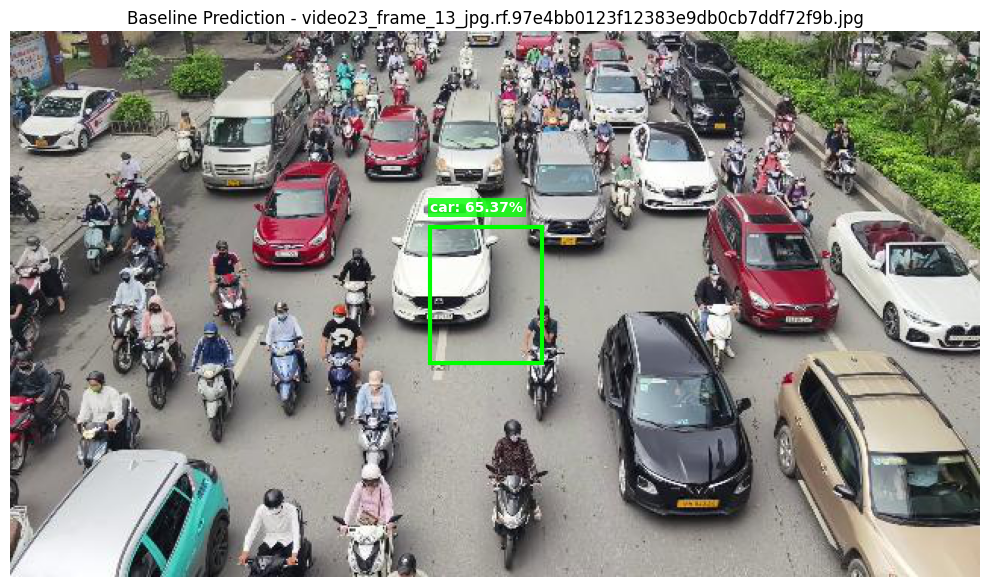

[1/10] Saved visual prediction for video23_frame_13_jpg.rf.97e4bb0123f12383e9db0cb7ddf72f9b.jpg
Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_1_video23_frame_13_jpg.rf.97e4bb0123f12383e9db0cb7ddf72f9b.jpg


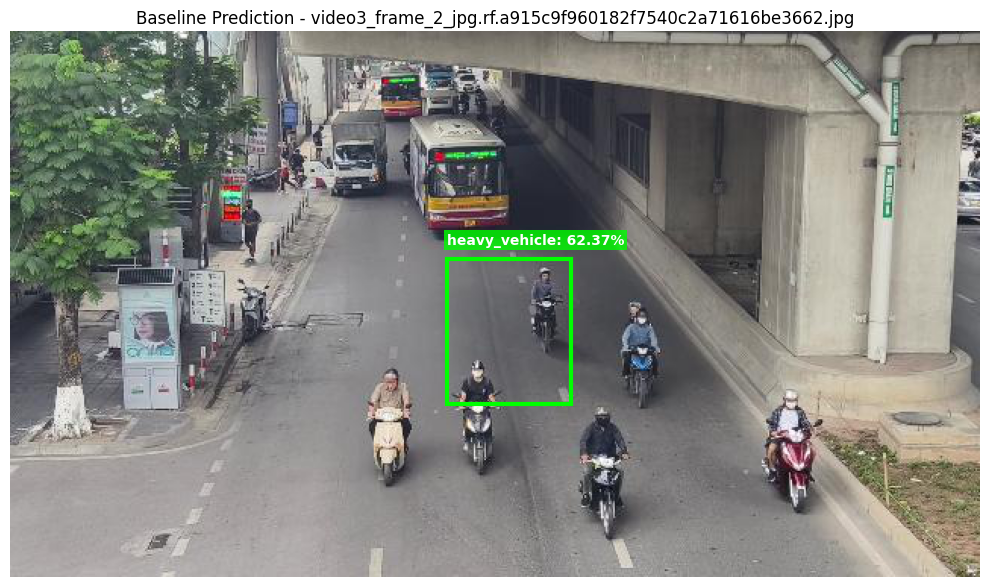

[2/10] Saved visual prediction for video3_frame_2_jpg.rf.a915c9f960182f7540c2a71616be3662.jpg
Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_2_video3_frame_2_jpg.rf.a915c9f960182f7540c2a71616be3662.jpg


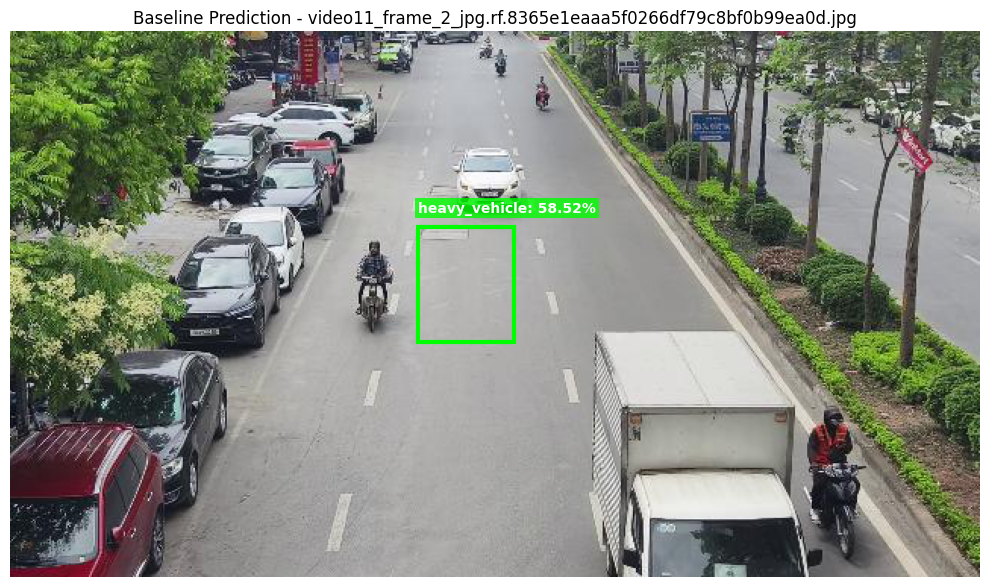

[3/10] Saved visual prediction for video11_frame_2_jpg.rf.8365e1eaaa5f0266df79c8bf0b99ea0d.jpg
Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_3_video11_frame_2_jpg.rf.8365e1eaaa5f0266df79c8bf0b99ea0d.jpg


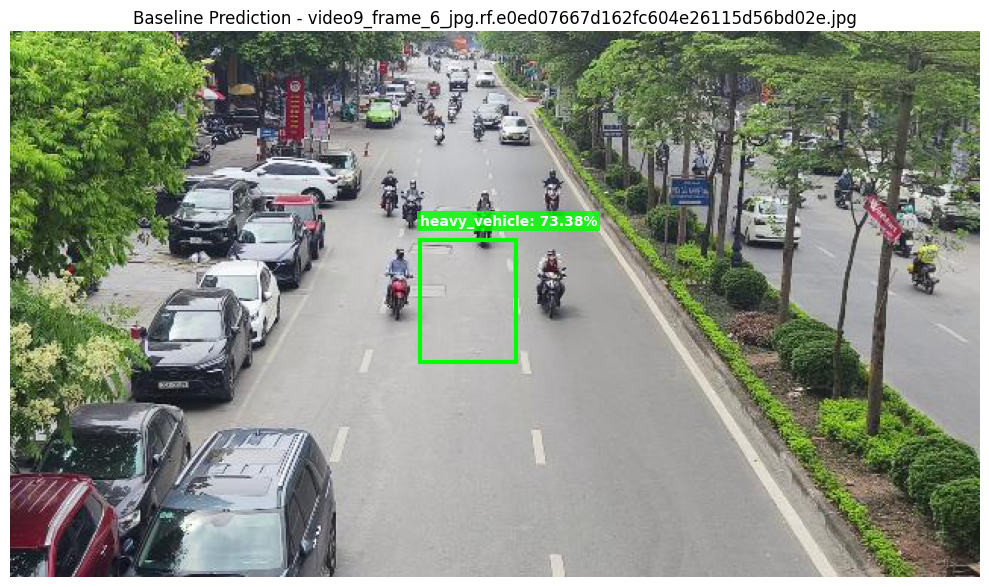

[4/10] Saved visual prediction for video9_frame_6_jpg.rf.e0ed07667d162fc604e26115d56bd02e.jpg
Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_4_video9_frame_6_jpg.rf.e0ed07667d162fc604e26115d56bd02e.jpg


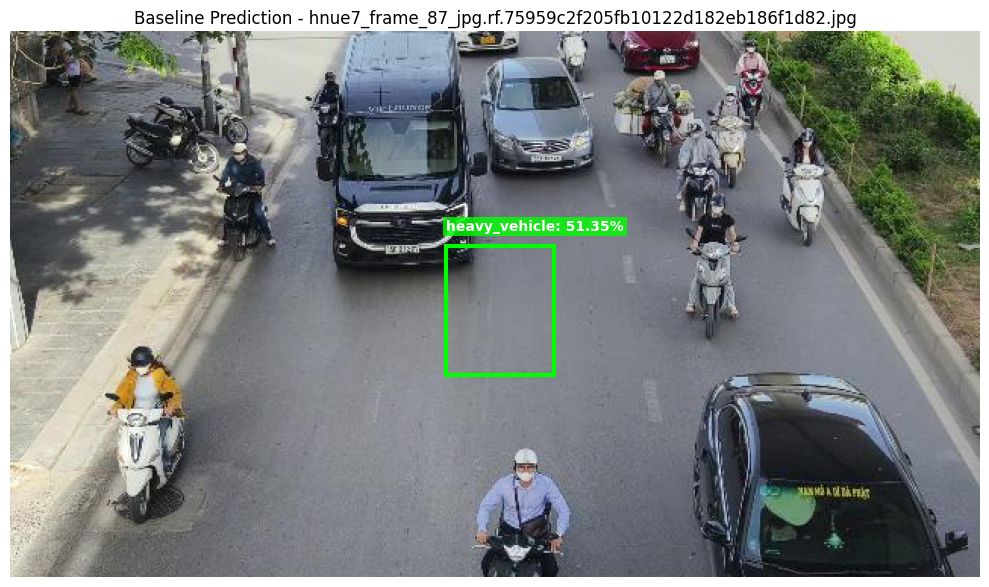

[5/10] Saved visual prediction for hnue7_frame_87_jpg.rf.75959c2f205fb10122d182eb186f1d82.jpg
Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_5_hnue7_frame_87_jpg.rf.75959c2f205fb10122d182eb186f1d82.jpg


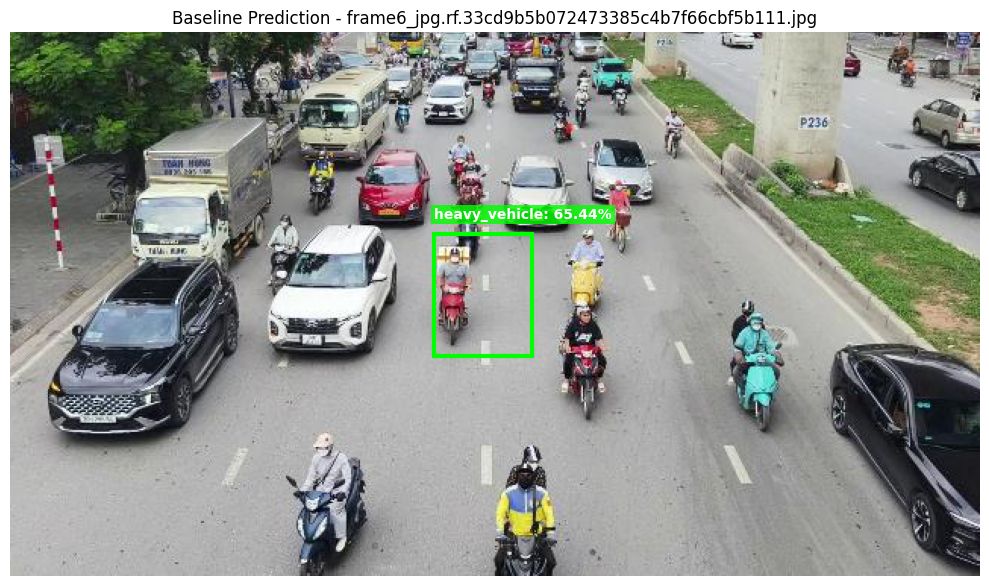

[6/10] Saved visual prediction for frame6_jpg.rf.33cd9b5b072473385c4b7f66cbf5b111.jpg
Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_6_frame6_jpg.rf.33cd9b5b072473385c4b7f66cbf5b111.jpg


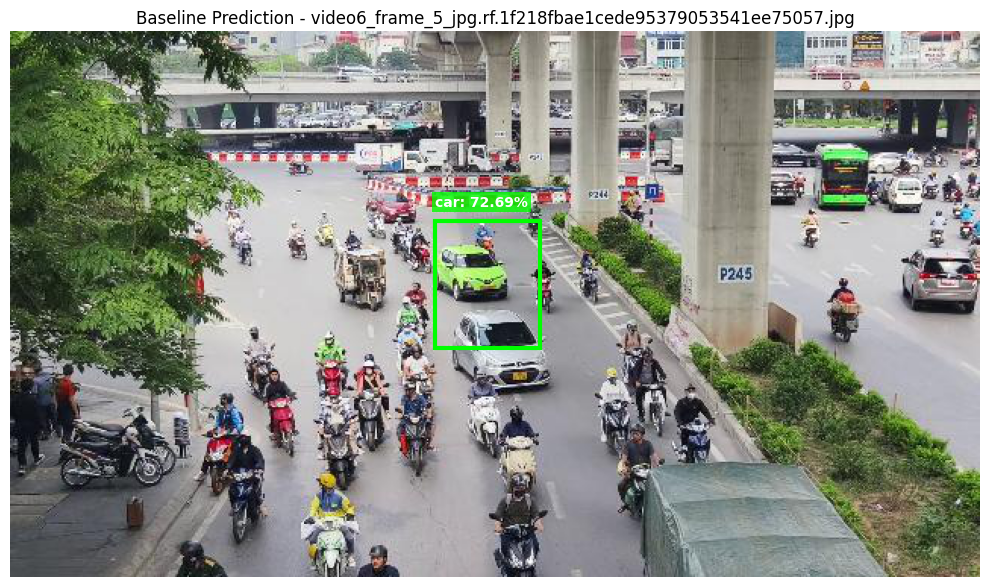

[7/10] Saved visual prediction for video6_frame_5_jpg.rf.1f218fbae1cede95379053541ee75057.jpg
Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_7_video6_frame_5_jpg.rf.1f218fbae1cede95379053541ee75057.jpg


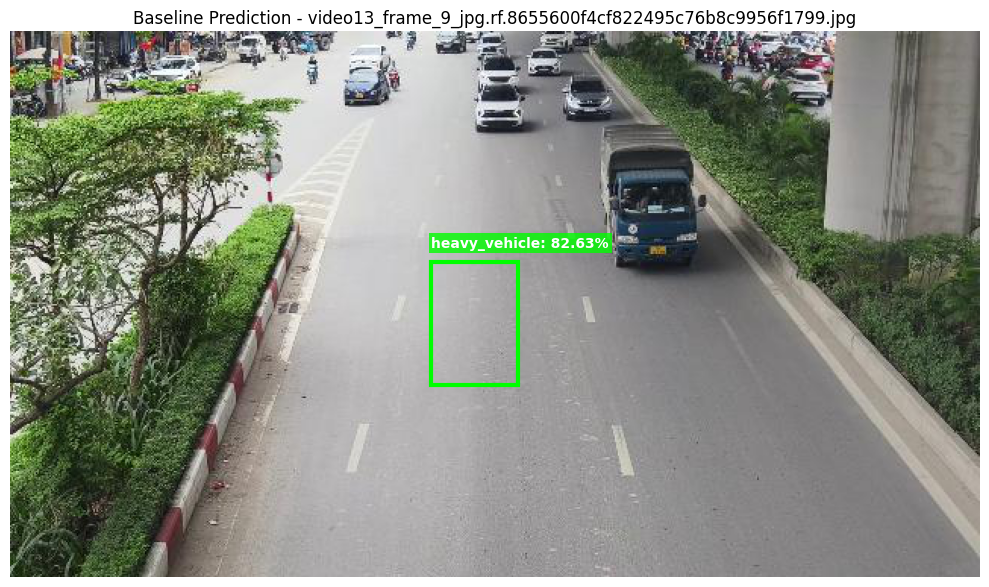

[8/10] Saved visual prediction for video13_frame_9_jpg.rf.8655600f4cf822495c76b8c9956f1799.jpg
Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_8_video13_frame_9_jpg.rf.8655600f4cf822495c76b8c9956f1799.jpg


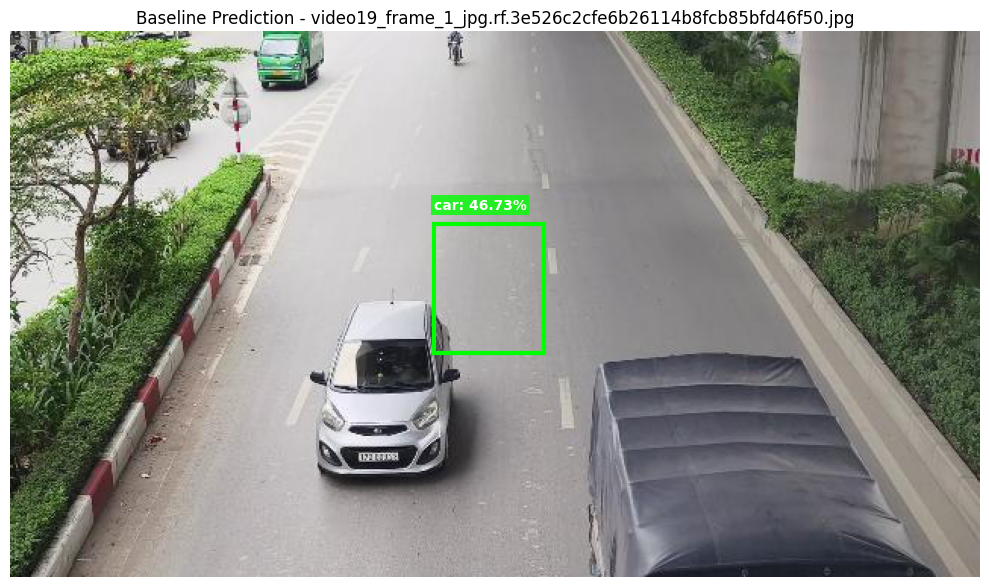

[9/10] Saved visual prediction for video19_frame_1_jpg.rf.3e526c2cfe6b26114b8fcb85bfd46f50.jpg
Saved visual prediction to Baseline Evaluation Metrics/Test Results\prediction_9_video19_frame_1_jpg.rf.3e526c2cfe6b26114b8fcb85bfd46f50.jpg


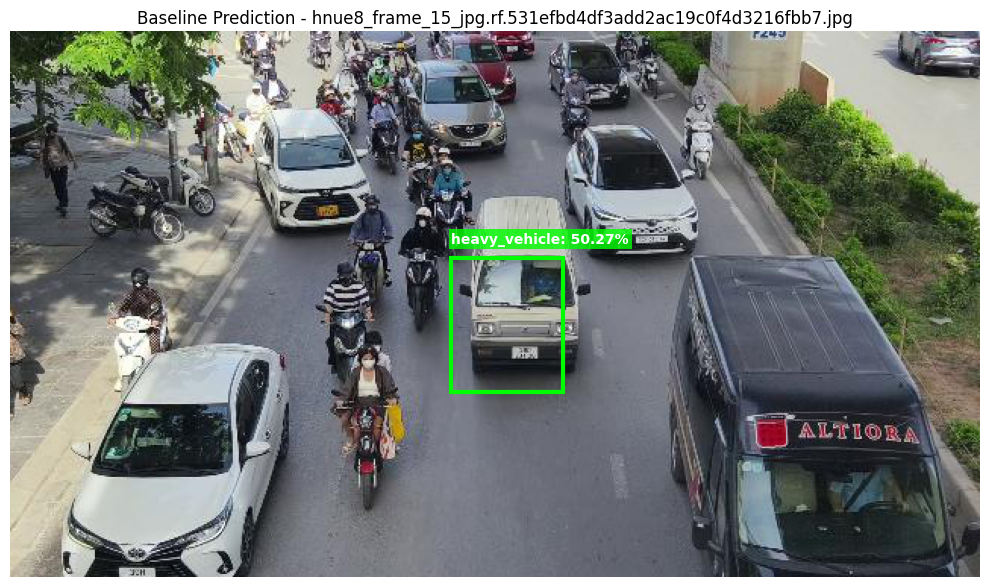

[10/10] Saved visual prediction for hnue8_frame_15_jpg.rf.531efbd4df3add2ac19c0f4d3216fbb7.jpg

All 10 inference images have been successfully written to Baseline Evaluation Metrics/Test Results!


In [ ]:
SaveDir = "Baseline Evaluation Metrics/Test Results"
os.makedirs(SaveDir, exist_ok=True)

BestModel = ConvolutionalNeuralNetwork().to(Device)
WeightModelPath = 'Baseline Model Path/Baseline Best Fold 1.pth' 
BestModel.load_state_dict(torch.load(WeightModelPath, map_location=Device))
BestModel.eval()

print(f"Successfully loaded weights from {WeightModelPath}")
print(f"Saving predictions to: {SaveDir}\n")

TestImageDir = os.path.join(DataRoot, TestFolder, 'images')
AllTestImages = [f for f in os.listdir(TestImageDir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

SampleCount = min(10, len(AllTestImages))
SelectedImages = random.sample(AllTestImages, SampleCount)

for idx, img_name in enumerate(SelectedImages):
    ImagePath = os.path.join(TestImageDir, img_name)
    Testing(ImagePath, BestModel, ValTF, Device, Classes, SavePath=SavePath)

    SavePath = os.path.join(SaveDir, f"prediction_{idx+1}_{img_name}")
    plt.savefig(SavePath, dpi=150, bbox_inches='tight')
    plt.close()
    
    print(f"[{idx+1}/{SampleCount}] Saved visual prediction for {img_name}")

print(f"\nAll {SampleCount} inference images have been successfully written to {SaveDir}!")